In [ ]:
# Cell 1 — Install dependencies (run once)
!pip install --quiet requests beautifulsoup4 pandas

In [ ]:
# Cell 2 — Imports & basic config
import requests
from bs4 import BeautifulSoup
import pandas as pd
import time
import random
from urllib.parse import urljoin

# Polite scraping configuration
HEADERS = {
    "User-Agent": "Alyyan-WebScraperDemo/1.0 (+https://example.com/contact) - learn responsibly"
}
BASE_URL = "http://quotes.toscrape.com"   # deliberately made for scraping practice
DELAY_MIN, DELAY_MAX = 0.8, 1.8         # randomized delay between requests


In [ ]:
# Cell 3 — Helper: fetch a page (with basic error handling)
def fetch(url, session=None, max_retries=3):
    """Fetch a URL and return BeautifulSoup object or None on failure."""
    sess = session or requests.Session()
    attempts = 0
    while attempts < max_retries:
        try:
            resp = sess.get(url, headers=HEADERS, timeout=10)
            resp.raise_for_status()
            return BeautifulSoup(resp.text, "html.parser")
        except Exception as e:
            attempts += 1
            wait = 1.0 * attempts
            print(f"[warn] fetch error (attempt {attempts}) for {url}: {e}; sleeping {wait}s")
            time.sleep(wait)
    print(f"[error] failed to fetch {url} after {max_retries} attempts")
    return None


In [ ]:
# Cell 4 — Parse one page of quotes
def parse_quotes_page(soup):
    """
    Given a BeautifulSoup object for a quotes page,
    return a list of dicts: {text, author, tags, author_url}
    """
    results = []
    quote_blocks = soup.select("div.quote")
    for qb in quote_blocks:
        text = qb.select_one("span.text").get_text(strip=True)
        author = qb.select_one("small.author").get_text(strip=True)
        tags = [t.get_text(strip=True) for t in qb.select("div.tags a.tag")]
        author_rel = qb.select_one("a")["href"]  # link to author page (relative)
        author_url = urljoin(BASE_URL, author_rel)
        results.append({
            "text": text,
            "author": author,
            "tags": ", ".join(tags),
            "author_url": author_url
        })
    return results


In [ ]:
# Cell 5 — Scrape multiple pages (pagination)
def scrape_quotes(max_pages=5):
    """
    Scrape quotes.toscrape.com for up to `max_pages` pages.
    Returns a pandas DataFrame.
    """
    session = requests.Session()
    page_url = BASE_URL + "/page/1/"
    all_quotes = []

    for page_no in range(1, max_pages + 1):
        url = BASE_URL + f"/page/{page_no}/"
        print(f"[info] fetching page {page_no}: {url}")
        soup = fetch(url, session=session)
        if not soup:
            break

        # If the page shows "No quotes found" or no quote blocks, stop early
        if not soup.select("div.quote"):
            print("[info] no quote blocks found — stopping pagination.")
            break

        page_quotes = parse_quotes_page(soup)
        all_quotes.extend(page_quotes)

        # Polite delay between requests
        time.sleep(random.uniform(DELAY_MIN, DELAY_MAX))

    df = pd.DataFrame(all_quotes)
    print(f"[done] scraped {len(df)} quotes from up to {max_pages} pages.")
    return df

# Run the scraper (small demo: 3 pages)
df_quotes = scrape_quotes(max_pages=3)
df_quotes.head(8)


[info] fetching page 1: http://quotes.toscrape.com/page/1/
[info] fetching page 2: http://quotes.toscrape.com/page/2/
[info] fetching page 3: http://quotes.toscrape.com/page/3/
[done] scraped 30 quotes from up to 3 pages.


,text,author,tags,author_url
0,“The world as we have created it is a process ...,Albert Einstein,"change, deep-thoughts, thinking, world",http://quotes.toscrape.com/author/Albert-Einstein
1,"“It is our choices, Harry, that show what we t...",J.K. Rowling,"abilities, choices",http://quotes.toscrape.com/author/J-K-Rowling
2,“There are only two ways to live your life. On...,Albert Einstein,"inspirational, life, live, miracle, miracles",http://quotes.toscrape.com/author/Albert-Einstein
3,"“The person, be it gentleman or lady, who has ...",Jane Austen,"aliteracy, books, classic, humor",http://quotes.toscrape.com/author/Jane-Austen
4,"“Imperfection is beauty, madness is genius and...",Marilyn Monroe,"be-yourself, inspirational",http://quotes.toscrape.com/author/Marilyn-Monroe
5,“Try not to become a man of success. Rather be...,Albert Einstein,"adulthood, success, value",http://quotes.toscrape.com/author/Albert-Einstein
6,“It is better to be hated for what you are tha...,André Gide,"life, love",http://quotes.toscrape.com/author/Andre-Gide
7,"“I have not failed. I've just found 10,000 way...",Thomas A. Edison,"edison, failure, inspirational, paraphrased",http://quotes.toscrape.com/author/Thomas-A-Edison


In [ ]:
# Cell 6 — Follow author pages and enrich dataset with author details
def parse_author_page(soup):
    """Extract author details from an author page soup."""
    born_date = soup.select_one(".author-born-date")
    born_loc = soup.select_one(".author-born-location")
    bio = soup.select_one(".author-description")
    return {
        "born_date": born_date.get_text(strip=True) if born_date else "",
        "born_location": born_loc.get_text(strip=True) if born_loc else "",
        "bio_snippet": bio.get_text(strip=True)[:300] if bio else ""
    }

def enrich_authors(df):
    """For each unique author_url in df, fetch author page and merge details."""
    session = requests.Session()
    author_cache = {}
    for url in df["author_url"].unique():
        if url in author_cache:
            continue
        print(f"[info] fetching author: {url}")
        soup = fetch(url, session=session)
        if not soup:
            author_cache[url] = {"born_date": "", "born_location": "", "bio_snippet": ""}
            continue
        author_cache[url] = parse_author_page(soup)
        time.sleep(random.uniform(DELAY_MIN, DELAY_MAX))

    # Map cached info back to dataframe
    df_enriched = df.copy()
    df_enriched["born_date"] = df_enriched["author_url"].map(lambda u: author_cache[u]["born_date"])
    df_enriched["born_location"] = df_enriched["author_url"].map(lambda u: author_cache[u]["born_location"])
    df_enriched["bio_snippet"] = df_enriched["author_url"].map(lambda u: author_cache[u]["bio_snippet"])
    return df_enriched

df_enriched = enrich_authors(df_quotes)
df_enriched.head(8)


[info] fetching author: http://quotes.toscrape.com/author/Albert-Einstein
[info] fetching author: http://quotes.toscrape.com/author/J-K-Rowling
[info] fetching author: http://quotes.toscrape.com/author/Jane-Austen
[info] fetching author: http://quotes.toscrape.com/author/Marilyn-Monroe
[info] fetching author: http://quotes.toscrape.com/author/Andre-Gide
[info] fetching author: http://quotes.toscrape.com/author/Thomas-A-Edison
[info] fetching author: http://quotes.toscrape.com/author/Eleanor-Roosevelt
[info] fetching author: http://quotes.toscrape.com/author/Steve-Martin
[info] fetching author: http://quotes.toscrape.com/author/Bob-Marley
[info] fetching author: http://quotes.toscrape.com/author/Dr-Seuss
[info] fetching author: http://quotes.toscrape.com/author/Douglas-Adams
[info] fetching author: http://quotes.toscrape.com/author/Elie-Wiesel
[info] fetching author: http://quotes.toscrape.com/author/Friedrich-Nietzsche
[info] fetching author: http://quotes.toscrape.com/author/Mark-Twai

,text,author,tags,author_url,born_date,born_location,bio_snippet
0,“The world as we have created it is a process ...,Albert Einstein,"change, deep-thoughts, thinking, world",http://quotes.toscrape.com/author/Albert-Einstein,"March 14, 1879","in Ulm, Germany","In 1879, Albert Einstein was born in Ulm, Germ..."
1,"“It is our choices, Harry, that show what we t...",J.K. Rowling,"abilities, choices",http://quotes.toscrape.com/author/J-K-Rowling,"July 31, 1965","in Yate, South Gloucestershire, England, The U...",See also: Robert GalbraithAlthough she writes ...
2,“There are only two ways to live your life. On...,Albert Einstein,"inspirational, life, live, miracle, miracles",http://quotes.toscrape.com/author/Albert-Einstein,"March 14, 1879","in Ulm, Germany","In 1879, Albert Einstein was born in Ulm, Germ..."
3,"“The person, be it gentleman or lady, who has ...",Jane Austen,"aliteracy, books, classic, humor",http://quotes.toscrape.com/author/Jane-Austen,"December 16, 1775","in Steventon Rectory, Hampshire, The United Ki...",Jane Austen was an English novelist whose work...
4,"“Imperfection is beauty, madness is genius and...",Marilyn Monroe,"be-yourself, inspirational",http://quotes.toscrape.com/author/Marilyn-Monroe,"June 01, 1926",in The United States,Marilyn Monroe (born Norma Jeane Mortenson; Ju...
5,“Try not to become a man of success. Rather be...,Albert Einstein,"adulthood, success, value",http://quotes.toscrape.com/author/Albert-Einstein,"March 14, 1879","in Ulm, Germany","In 1879, Albert Einstein was born in Ulm, Germ..."
6,“It is better to be hated for what you are tha...,André Gide,"life, love",http://quotes.toscrape.com/author/Andre-Gide,"November 22, 1869","in Paris, France",André Paul Guillaume Gide was a French author ...
7,"“I have not failed. I've just found 10,000 way...",Thomas A. Edison,"edison, failure, inspirational, paraphrased",http://quotes.toscrape.com/author/Thomas-A-Edison,"February 11, 1847","in Milan, Ohio, The United States","Thomas Alva Edison was an American inventor, s..."


In [ ]:
# Cell 7 — Save results and quick analysis
out_path = "quotes_scraped.csv"
df_enriched.to_csv(out_path, index=False)
print(f"[saved] csv -> {out_path}")

# quick stats
print("\nTop tags (frequency):")
tag_series = df_enriched["tags"].str.split(", ").explode().value_counts().head(10)
print(tag_series)


[saved] csv -> quotes_scraped.csv

Top tags (frequency):
tags
life             7
love             6
inspirational    5
humor            4
friends          3
books            2
friendship       2
thinking         1
abilities        1
live             1
Name: count, dtype: int64


# **CAR Images Scrapper**

In [ ]:
# Cell 1 - Install dependencies
!pip install --quiet requests pandas pillow imagehash tqdm


In [ ]:
# Cell 2 - Imports & configuration
import os, time, random, hashlib, io
from urllib.parse import urlencode
from pathlib import Path
import requests
from PIL import Image
import imagehash
import pandas as pd
from tqdm import tqdm

# Polite defaults
USER_AGENT = "Alyyan-DatasetBuilder/1.0 (+https://example.com/contact)"
HEADERS = {"User-Agent": USER_AGENT}
MIN_WIDTH = 200     # minimum allowed width (pixels)
MIN_HEIGHT = 200    # minimum allowed height (pixels)
PHASH_HAMMING_THRESHOLD = 6  # <= this considered duplicate (tweakable)
DELAY_MIN, DELAY_MAX = 0.4, 1.2
MAX_PER_SOURCE = 50  # per API default; you can change when invoking


In [ ]:
# Cell 3 - Helper utilities: safe filename, sha256, save image, compute hashes
def safe_fname(s):
    # create a short safe filename from string
    return "".join(c if c.isalnum() or c in "._-" else "_" for c in s)[:150]

def sha256_bytes(b: bytes) -> str:
    return hashlib.sha256(b).hexdigest()

def ensure_dir(p):
    Path(p).mkdir(parents=True, exist_ok=True)

def image_from_bytes(b: bytes):
    return Image.open(io.BytesIO(b))

def compute_phash(img: Image.Image):
    # convert to RGB then compute phash
    try:
        im = img.convert("RGB")
    except Exception:
        im = img.copy().convert("RGB")
    return imagehash.phash(im)

def save_image_bytes(b: bytes, out_path: str):
    with open(out_path, "wb") as f:
        f.write(b)


In [ ]:
# Cell 4 - Deduplication store & helper (phash + sha256)
class Deduper:
    def __init__(self, phash_threshold=PHASH_HAMMING_THRESHOLD):
        self.phash_list = []  # list of imagehash.ImageHash
        self.sha_set = set()
        self.threshold = phash_threshold

    def is_duplicate(self, phash_obj, sha256_hex):
        # check sha256 exact match
        if sha256_hex in self.sha_set:
            return True
        # check perceptual hash distance
        for existing in self.phash_list:
            if phash_obj - existing <= self.threshold:
                return True
        return False

    def add(self, phash_obj, sha256_hex):
        self.phash_list.append(phash_obj)
        self.sha_set.add(sha256_hex)


In [ ]:
# Cell 5 - API client functions (Unsplash, Pexels, Pixabay)
# You must obtain keys and paste them below. See comments to get keys.

# >>> GET YOUR KEYS:
# Unsplash:  https://unsplash.com/developers  -> Access Key (Client ID)
# Pexels:    https://www.pexels.com/api/      -> API Key
# Pixabay:   https://pixabay.com/api/docs/    -> API Key

UNSPLASH_ACCESS_KEY = "asM4HPlZWyAt8yd-VapA3GhdJttllQMjORoLHHlQ9V8"
PEXELS_API_KEY = "sHuRh53TNXpHiGpqk8KF2IQ21y13cESRaCymBHhWqvvfWov1UAiGQsCx"
PIXABAY_API_KEY = "53089747-bcc2446aaf871dfc118ea872a"

# ---- Unsplash client (search/photos) ----
def unsplash_search(query, per_page=30, page=1):
    if not UNSPLASH_ACCESS_KEY:
        return []
    url = "https://api.unsplash.com/search/photos"
    params = {"query": query, "per_page": per_page, "page": page}
    headers = {"Authorization": f"Client-ID {UNSPLASH_ACCESS_KEY}", "User-Agent": USER_AGENT}
    r = requests.get(url, params=params, headers=headers, timeout=15)
    r.raise_for_status()
    data = r.json()
    results = []
    for item in data.get("results", []):
        # choose 'regular' or 'full' depending on size required; 'regular' is usually fine
        img_url = item["urls"].get("raw") or item["urls"].get("full") or item["urls"].get("regular")
        results.append({
            "source": "unsplash",
            "id": item.get("id"),
            "image_url": img_url,
            "page_url": item.get("links", {}).get("html"),
            "meta": item
        })
    return results

# ---- Pexels client (search) ----
def pexels_search(query, per_page=30, page=1):
    if not PEXELS_API_KEY:
        return []
    url = "https://api.pexels.com/v1/search"
    params = {"query": query, "per_page": per_page, "page": page}
    headers = {"Authorization": PEXELS_API_KEY, "User-Agent": USER_AGENT}
    r = requests.get(url, params=params, headers=headers, timeout=15)
    r.raise_for_status()
    data = r.json()
    results = []
    for item in data.get("photos", []):
        # choose 'original' or 'large' etc.
        img_url = item.get("src", {}).get("original") or item.get("src", {}).get("large")
        results.append({
            "source": "pexels",
            "id": item.get("id"),
            "image_url": img_url,
            "page_url": item.get("url"),
            "meta": item
        })
    return results

# ---- Pixabay client (search) ----
def pixabay_search(query, per_page=50, page=1):
    if not PIXABAY_API_KEY:
        return []
    url = "https://pixabay.com/api/"
    params = {"key": PIXABAY_API_KEY, "q": query, "image_type": "photo", "per_page": per_page, "page": page}
    r = requests.get(url, params=params, headers=HEADERS, timeout=15)
    r.raise_for_status()
    data = r.json()
    results = []
    for item in data.get("hits", []):
        img_url = item.get("largeImageURL") or item.get("webformatURL")
        results.append({
            "source": "pixabay",
            "id": item.get("id"),
            "image_url": img_url,
            "page_url": item.get("pageURL"),
            "meta": item
        })
    return results


In [ ]:
# Cell 6 - Generic image fetcher with retries, and basic captcha detection on HTML fallback
def fetch_image_bytes(url, headers=None, max_retries=3):
    headers = headers or HEADERS
    for attempt in range(1, max_retries+1):
        try:
            r = requests.get(url, headers=headers, timeout=18)
            r.raise_for_status()
            # quick content-type check
            ct = r.headers.get("Content-Type", "").lower()
            if "html" in ct:
                # sometimes API returns an HTML landing page (could indicate blocking or wrong URL)
                raise RuntimeError("Expected image content but got HTML -> possible redirect/block")
            return r.content
        except Exception as e:
            if attempt < max_retries:
                sleep = attempt * 0.8
                time.sleep(sleep)
            else:
                raise


In [ ]:
# Cell 7 - Orchestrator: search multiple sources and download with dedupe
def build_dataset(keyword,
                  out_root="dataset",
                  per_source=30,
                  max_total=300,
                  min_width=MIN_WIDTH,
                  min_height=MIN_HEIGHT,
                  phash_threshold=PHASH_HAMMING_THRESHOLD,
                  allow_manual_urls=None):
    """
    keyword: string, e.g. "Porsche"
    allow_manual_urls: list of dicts with keys {'url', 'source'(optional), 'page_url'(optional)}
    """
    # preparatory
    label = safe_fname(keyword)
    out_dir = Path(out_root) / label
    ensure_dir(out_dir)
    meta_rows = []
    deduper = Deduper(phash_threshold=phash_threshold)

    # Gather candidates from APIs (multi-page if needed)
    candidates = []

    # Unsplash
    try:
        for p in range(1, (per_source // 30) + 2):
            res = unsplash_search(keyword, per_page=min(30, per_source), page=p)
            if not res:
                break
            candidates.extend(res)
            if len(res) < per_source:
                break
            if len(candidates) >= per_source:
                break
            time.sleep(random.uniform(DELAY_MIN, DELAY_MAX))
    except Exception as e:
        print(f"[warn] Unsplash search failed: {e}")

    # Pexels
    try:
        for p in range(1, (per_source // 30) + 2):
            res = pexels_search(keyword, per_page=min(30, per_source), page=p)
            if not res:
                break
            candidates.extend(res)
            if len(res) < per_source:
                break
            if len(candidates) >= per_source * 2:
                break
            time.sleep(random.uniform(DELAY_MIN, DELAY_MAX))
    except Exception as e:
        print(f"[warn] Pexels search failed: {e}")

    # Pixabay
    try:
        for p in range(1, (per_source // 50) + 2):
            res = pixabay_search(keyword, per_page=min(50, per_source), page=p)
            if not res:
                break
            candidates.extend(res)
            if len(res) < per_source:
                break
            if len(candidates) >= per_source * 3:
                break
            time.sleep(random.uniform(DELAY_MIN, DELAY_MAX))
    except Exception as e:
        print(f"[warn] Pixabay search failed: {e}")

    # Manual URLs (optional)
    if allow_manual_urls:
        for u in allow_manual_urls:
            candidates.append({
                "source": u.get("source", "manual"),
                "id": None,
                "image_url": u["url"],
                "page_url": u.get("page_url"),
                "meta": {}
            })

    print(f"[info] Total candidate images gathered: {len(candidates)}")

    saved_count = 0
    idx = 0
    # Shuffle candidates to mix sources
    random.shuffle(candidates)

    for cand in tqdm(candidates, desc="processing candidates"):
        if saved_count >= max_total:
            break
        img_url = cand.get("image_url")
        if not img_url:
            continue
        # try to fetch image bytes
        try:
            time.sleep(random.uniform(DELAY_MIN, DELAY_MAX))
            b = fetch_image_bytes(img_url)
            sha = sha256_bytes(b)
            # quick check for duplication via sha
            if sha in deduper.sha_set:
                # exact duplicate
                continue
            # open image and check dimensions
            try:
                img = image_from_bytes(b)
            except Exception as e:
                # not an image
                continue
            width, height = img.size
            if width < min_width or height < min_height:
                # skip too small images
                continue

            phash_obj = compute_phash(img)
            if deduper.is_duplicate(phash_obj, sha):
                continue

            # save image in JPEG format with a stable file name
            idx += 1
            fname = f"{label}_{idx:05d}.jpg"
            out_path = out_dir / fname
            # convert and save as JPEG to ensure consistent format
            rgb = img.convert("RGB")
            buf = io.BytesIO()
            rgb.save(buf, format="JPEG", quality=90)
            content = buf.getvalue()
            save_image_bytes(content, str(out_path))

            file_size = out_path.stat().st_size
            deduper.add(phash_obj, sha)

            meta_rows.append({
                "filename": fname,
                "label": label,
                "source": cand.get("source"),
                "source_id": cand.get("id"),
                "source_page_url": cand.get("page_url"),
                "image_url": img_url,
                "width": width,
                "height": height,
                "file_size": file_size,
                "sha256": sha,
                "phash": str(phash_obj)
            })

            saved_count += 1

        except Exception as e:
            # log and continue
            # in Colab environment, we don't fail everything for one broken image
            print(f"[warn] failed to process {img_url}: {e}")
            continue

    # Save metadata CSV
    meta_df = pd.DataFrame(meta_rows)
    csv_path = out_dir / f"{label}_metadata.csv"
    meta_df.to_csv(csv_path, index=False)
    print(f"[done] Saved {saved_count} images to {out_dir} and metadata to {csv_path}")
    return {"out_dir": str(out_dir), "csv": str(csv_path), "count": saved_count}


In [ ]:
# Cell 8 - Run it: prompt for the keyword and options, then build dataset
# You can run multiple times with different keywords.
keyword = input("Enter the keyword / tag (e.g., Porsche, Ferrari): ").strip() or "Porsche"
per_source = int(input("Per-source max images to request (e.g., 30): ") or "30")
max_total = int(input("Max total images to save (e.g., 200): ") or "200")
min_w = int(input(f"Minimum width in px (default {MIN_WIDTH}): ") or str(MIN_WIDTH))
min_h = int(input(f"Minimum height in px (default {MIN_HEIGHT}): ") or str(MIN_HEIGHT))

# OPTIONAL: manual URLs
manual = input("Do you want to add manual image URLs? Type 'y' to add, otherwise press Enter: ").strip().lower()
manual_urls = None
if manual == 'y':
    print("Enter one image URL per line. End with an empty line.")
    manual_urls = []
    while True:
        line = input().strip()
        if not line:
            break
        manual_urls.append({"url": line, "source": "manual", "page_url": None})

print("Starting dataset building ...")
res = build_dataset(keyword,
                    out_root="dataset",
                    per_source=per_source,
                    max_total=max_total,
                    min_width=min_w,
                    min_height=min_h,
                    allow_manual_urls=manual_urls)
print(res)


Enter the keyword / tag (e.g., Porsche, Ferrari): honda
Per-source max images to request (e.g., 30): 100
Max total images to save (e.g., 200): 200
Minimum width in px (default 200): 200
Minimum height in px (default 200): 200
Do you want to add manual image URLs? Type 'y' to add, otherwise press Enter: 
Starting dataset building ...
[info] Total candidate images gathered: 110


processing candidates: 100%|██████████| 110/110 [03:19<00:00,  1.82s/it]

[done] Saved 109 images to dataset/honda and metadata to dataset/honda/honda_metadata.csv
{'out_dir': 'dataset/honda', 'csv': 'dataset/honda/honda_metadata.csv', 'count': 109}


,filename,label,source,source_id,source_page_url,image_url,width,height,file_size,sha256,phash
0,honda_00001.jpg,honda,pexels,5184909,https://www.pexels.com/photo/a-man-touching-hi...,https://images.pexels.com/photos/5184909/pexel...,3939,5908,3259019,17aeeeb3e576ad1d10d4d5c034b372380eec452f1e558f...,cb71956c8518bbd2
1,honda_00002.jpg,honda,pixabay,2546770,https://pixabay.com/photos/motorcycle-blue-whi...,https://pixabay.com/get/g38cdf576a459a63699676...,1280,853,344185,c71b1c8dfad6278a6cfcac4211842dc32bebf069fec2a2...,e1cd9232396dc4f2
2,honda_00003.jpg,honda,pixabay,3768901,https://pixabay.com/photos/engine-honda-honda-...,https://pixabay.com/get/gea06556140b692b9dd002...,1280,853,309280,21a6dcc530b440f1c3f864ebb4f6d8d64eff31cb12e9f2...,c796b43a43e51c59
3,honda_00004.jpg,honda,pexels,1578540,https://www.pexels.com/photo/man-wearing-guy-f...,https://images.pexels.com/photos/1578540/pexel...,3456,5184,2045732,b4887c856061c6805472aabae0af995aa7d79ee8713229...,e6e4d91166a6986b
4,honda_00005.jpg,honda,pixabay,5895473,https://pixabay.com/photos/motorcycle-bike-veh...,https://pixabay.com/get/ga1cba3737e5d363483056...,853,1280,223175,1e1a1c65b029437d7b00f22852910840af516d6d933cb5...,808ff5730b3d05b6
5,honda_00006.jpg,honda,pixabay,3749159,https://pixabay.com/photos/honda-honda-vtx-hon...,https://pixabay.com/get/g866f7a74cb03be10c8ea6...,1280,853,171207,403f2f7752c855ee56f5dbc55cc575339bfdf29d7520e4...,959c4ae115d2d71b
6,honda_00007.jpg,honda,unsplash,spxgIcI7YGo,https://unsplash.com/photos/red-ferrari-458-it...,https://images.unsplash.com/photo-160025982852...,5304,7952,9231144,5737e47c7bd40e2c66f1298e4e51b0e19a8dbd7f64b4c4...,f6a6ccb938c0193b
7,honda_00008.jpg,honda,pixabay,3768905,https://pixabay.com/photos/engine-honda-honda-...,https://pixabay.com/get/gfb30efd591d0706ff11db...,1280,853,229596,ef5c84440682a31d8287cf75972f1e2ea2df39c44e46fa...,832b593c966727b2
8,honda_00009.jpg,honda,pexels,1629180,https://www.pexels.com/photo/side-view-photo-o...,https://images.pexels.com/photos/1629180/pexel...,2752,3820,2716064,0988e8b013e339c4ea0eea92c8bdf7703485f4121b48ad...,c6b3b84dd1c4c738
9,honda_00010.jpg,honda,unsplash,14QeXgvmaRU,https://unsplash.com/photos/a-red-car-driving-...,https://images.unsplash.com/photo-168139235263...,5844,3896,5242495,819f4dc1983f9add224496f053c829665345a17b65316e...,94f447f130cca5f2


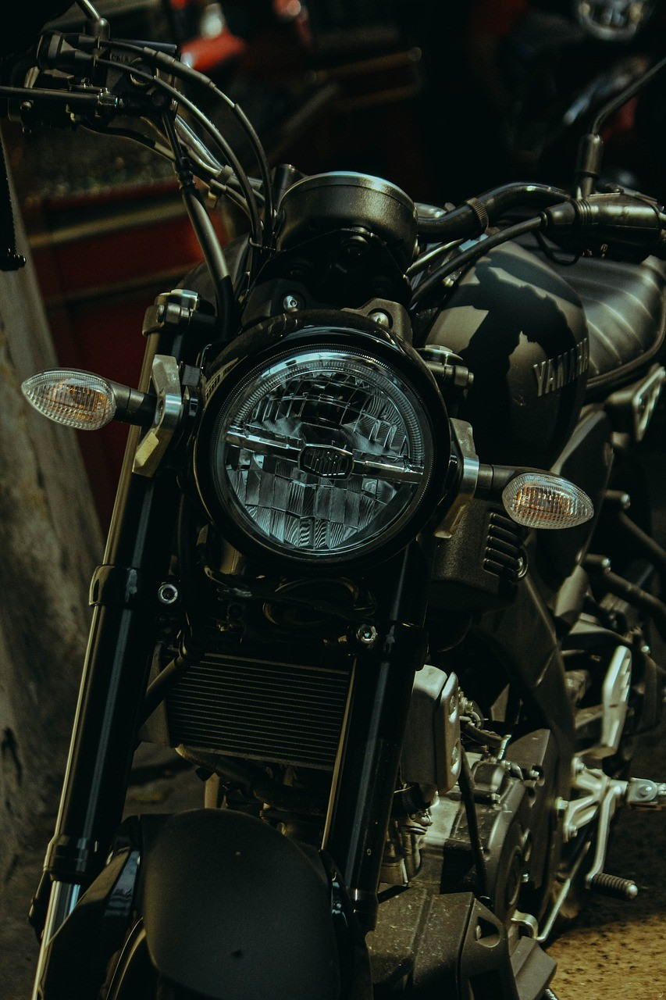

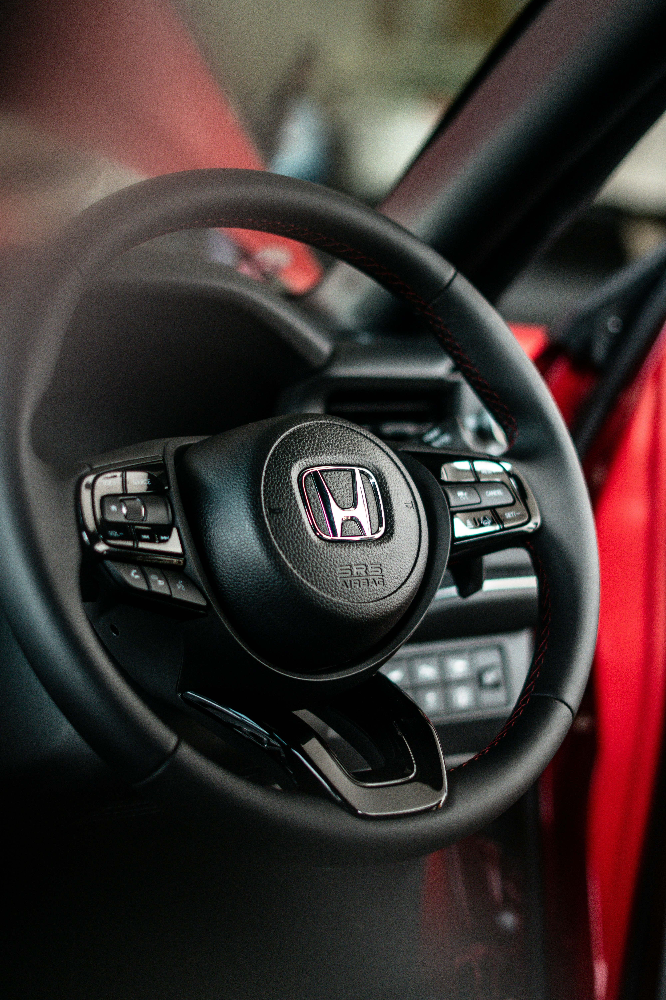

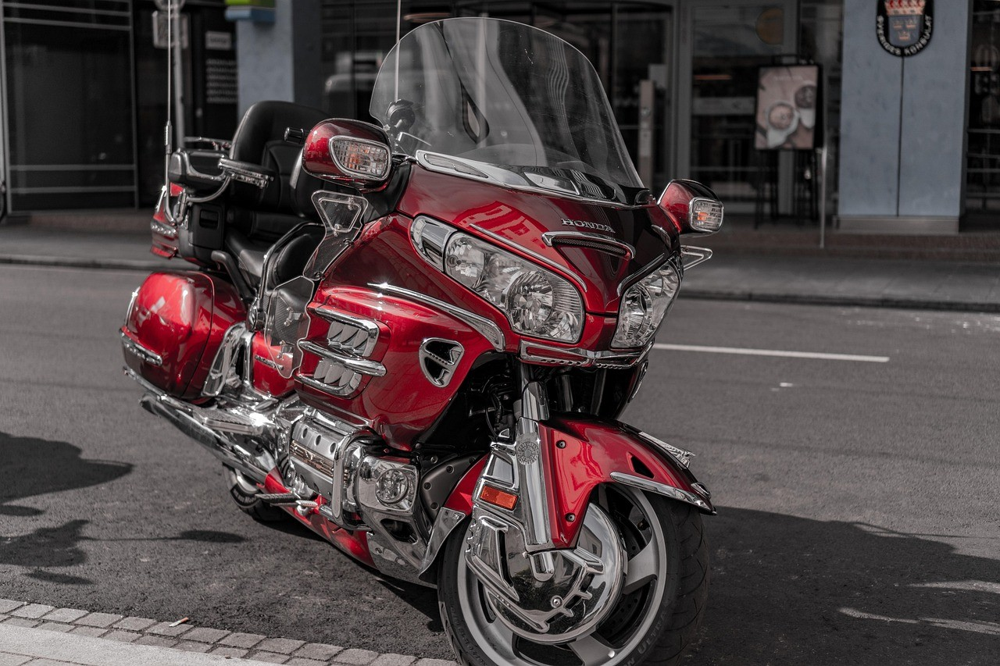

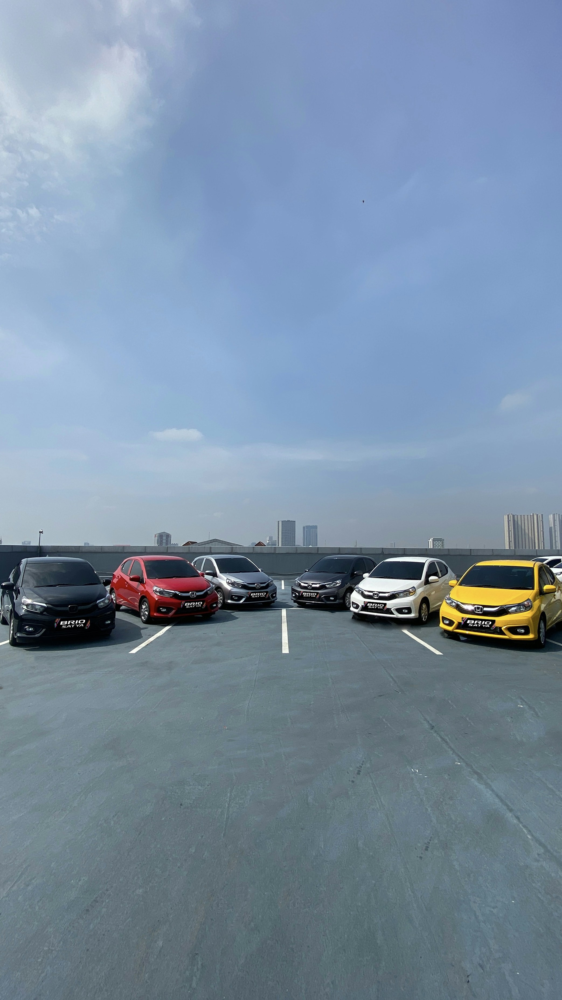

In [ ]:
# Cell 9 - Quick preview of saved metadata and sample images
import pandas as pd
from IPython.display import display, Image as IPyImage

out_dir = Path(res['out_dir'])
csv_path = Path(res['csv'])
if csv_path.exists():
    df = pd.read_csv(csv_path)
    display(df.head(12))
    # show up to 4 sample images
    sample_files = list(out_dir.glob("*.jpg"))[:4]
    for f in sample_files:
        display(IPyImage(filename=str(f), width=400))
else:
    print("No metadata CSV found. Did the run complete?")
